In [1]:
from __future__ import division
import numpy as np
import os
import glob

from random import *
from PIL import Image
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.image as mpimg
%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Lambda, ELU, Activation, BatchNormalization
from keras.layers.convolutional import Convolution2D, Cropping2D, ZeroPadding2D, MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD, Adam, RMSprop

Using TensorFlow backend.


In [2]:
sample = pd.read_csv('train_face_value_label.csv', names=['name','label'], skiprows=1)#.head()
sample['label_cat'] = sample.label.astype('category').cat.codes.astype(int)
sample.label = sample.label.astype('str')
sample.head()
sample.label_cat.value_counts().sort_index()

0    4233
1    4373
2    4407
3    4424
4    4411
5    4413
6    4283
7    4408
8    4668
Name: label_cat, dtype: int64

IAQBKYCE.jpg (407, 796, 3) 0 0.3082 0.3349 0.3569
HLGOCWMP.jpg (402, 797, 3) 1 0.3087 0.3356 0.3557
AEY1GZ3Q.jpg (314, 573, 3) 0 0.3228 0.3418 0.3354
IETBHG3X.jpg (410, 803, 3) 1 0.3021 0.3349 0.363


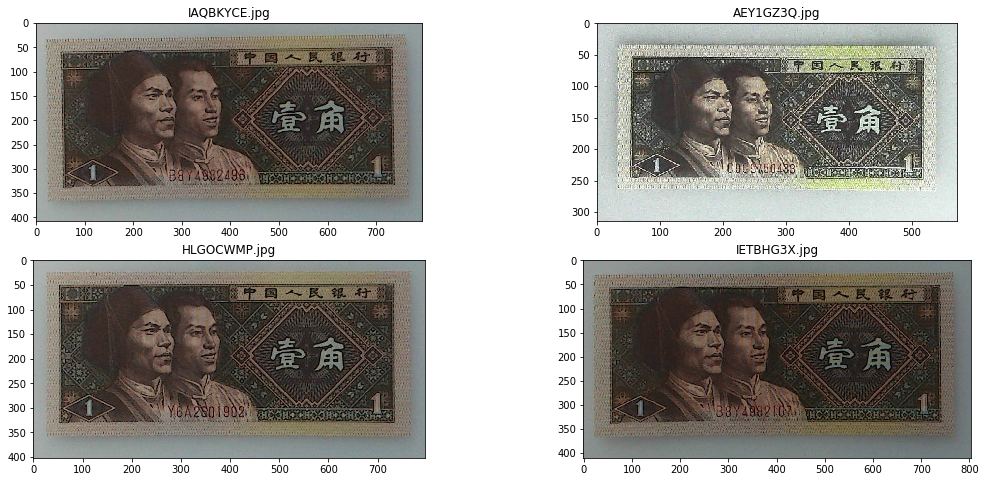

PWQNUKM4.jpg (297, 591, 3) 0 0.3353 0.3512 0.3135
NES87TBH.jpg (464, 930, 3) 1 0.3288 0.3545 0.3167
4YKHDNG9.jpg (411, 843, 3) 0 0.3428 0.355 0.3022
5KZL3P79.jpg (600, 1340, 3) 1 0.3283 0.3648 0.307


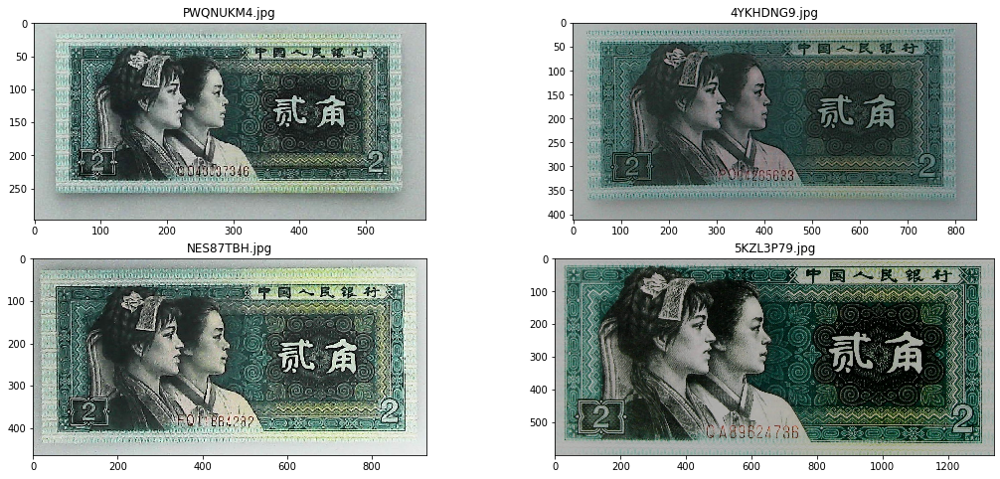

ZMAVPGFH.jpg (600, 1187, 3) 0 0.3086 0.2988 0.3926
7NMIQER0.jpg (327, 628, 3) 1 0.3162 0.3308 0.353
GWEXUNLA.jpg (465, 966, 3) 0 0.3173 0.3173 0.3654
FMVQCYK1.jpg (317, 621, 3) 1 0.3245 0.3252 0.3503


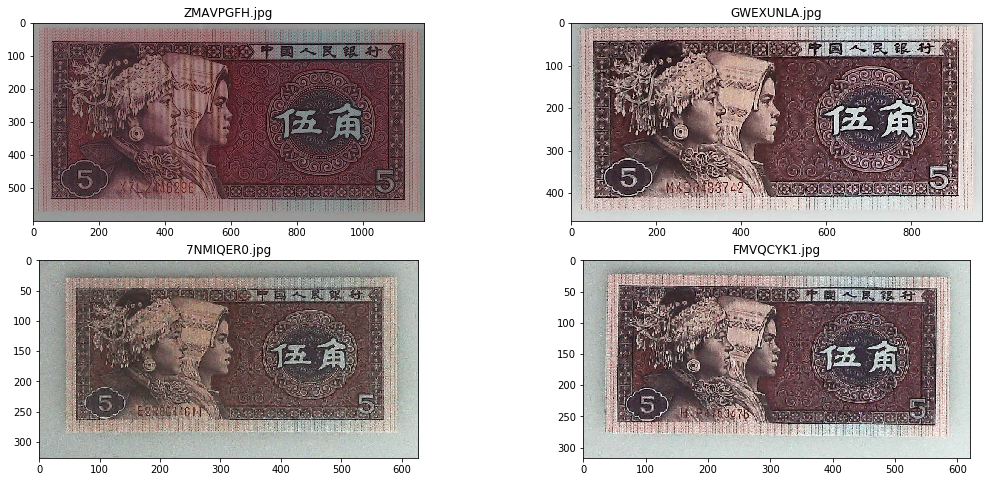

GPC7A31L.jpg (600, 1233, 3) 0 0.3109 0.3225 0.3666
1GP6WZ4O.jpg (358, 705, 3) 1 0.2995 0.3335 0.3671
WVQDK9HO.jpg (600, 1274, 3) 0 0.3105 0.3217 0.3679
4GFBA571.jpg (600, 1310, 3) 1 0.2892 0.3206 0.3902


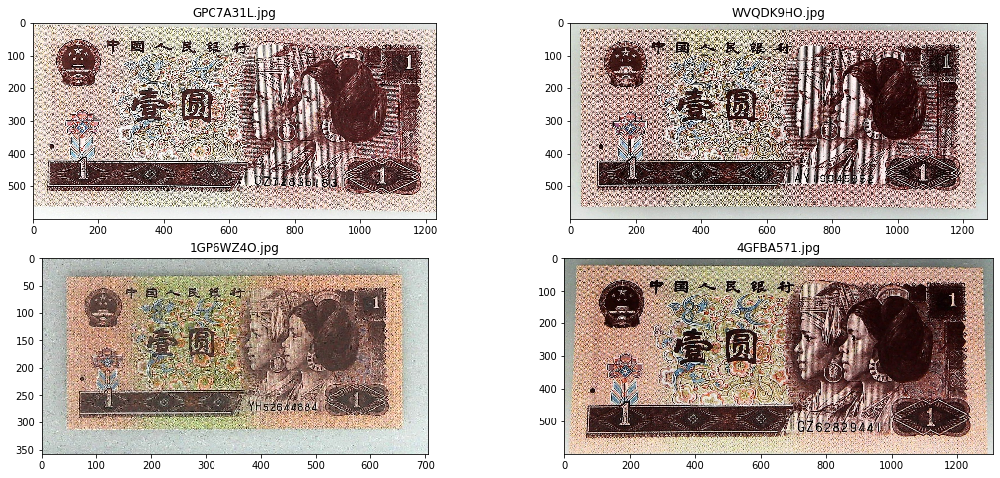

LQ2B8Z41.jpg (600, 1270, 3) 0 0.3182 0.36 0.3217
CGI3TR6Z.jpg (468, 978, 3) 1 0.3211 0.3686 0.3103
HASRLDPX.jpg (600, 1293, 3) 0 0.3237 0.351 0.3253
RG0G3Z8K.jpg (363, 731, 3) 1 0.3107 0.3638 0.3255


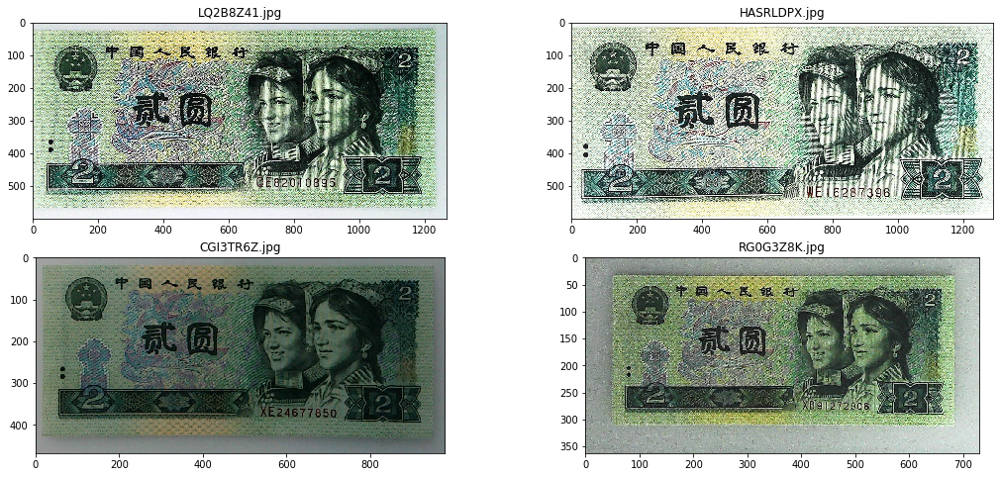

D5QELW6B.jpg (396, 756, 3) 0 0.3062 0.3482 0.3456
02NL679A.jpg (600, 1322, 3) 1 0.3059 0.3306 0.3635
QGB354E6.jpg (600, 1260, 3) 0 0.3066 0.3368 0.3566
V7F631LG.jpg (390, 752, 3) 1 0.3019 0.3474 0.3507


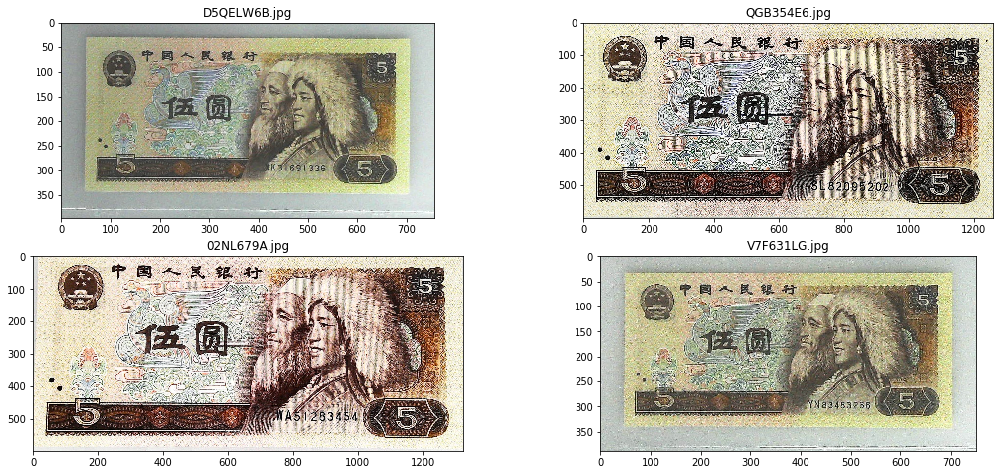

ZA0HNKFG.jpg (383, 752, 3) 0 0.3324 0.3364 0.3312
2FUGOA8L.jpg (600, 1324, 3) 1 0.334 0.326 0.34
9Z4EI3A5.jpg (515, 1058, 3) 0 0.3436 0.3415 0.3149
0V8TPN16.jpg (478, 1039, 3) 1 0.3402 0.3369 0.3229


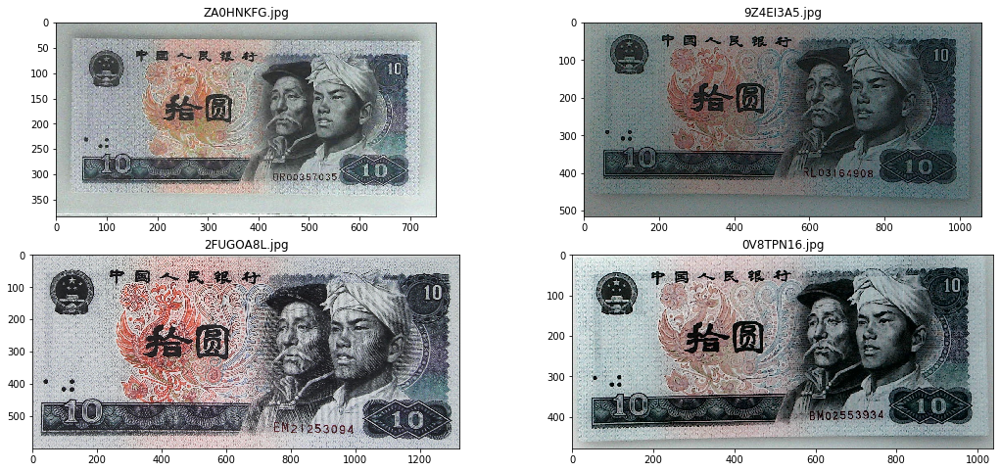

XW2Y4CHU.jpg (422, 805, 3) 0 0.2895 0.3638 0.3468
1OQ5XI8P.jpg (581, 1134, 3) 1 0.2964 0.3454 0.3582
MR4XS79Z.jpg (600, 1176, 3) 0 0.3014 0.3535 0.3451
S70COKMH.jpg (600, 1215, 3) 1 0.3027 0.3497 0.3476


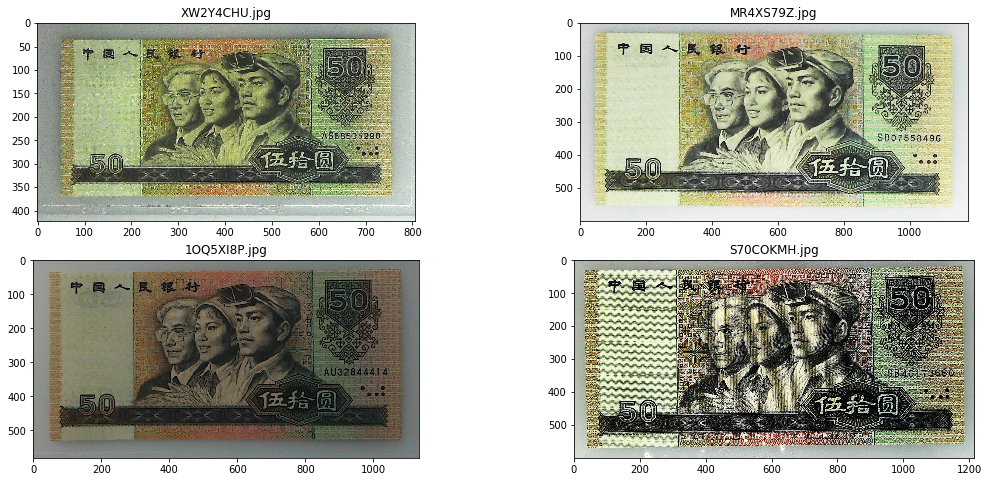

PS26GYK5.jpg (600, 1207, 3) 0 0.3321 0.3346 0.3334
S3GXDQIN.jpg (600, 1207, 3) 1 0.3428 0.344 0.3132
N67BTSUG.jpg (600, 1241, 3) 0 0.3487 0.339 0.3123
6HLXZ3TS.jpg (426, 808, 3) 1 0.3309 0.338 0.3311


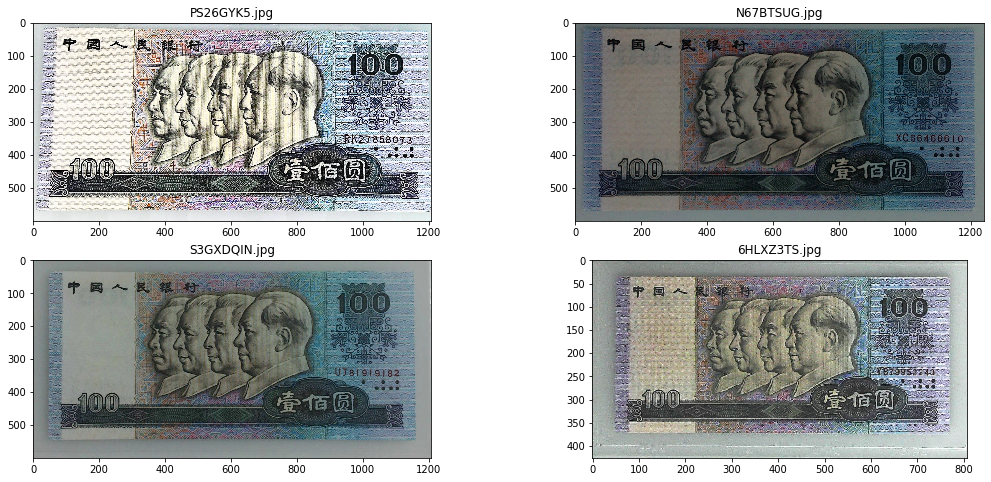

In [3]:
import cv2
for label in range(9):
    row_num = 2
    fig,ax = plt.subplots(row_num,2, figsize=(18,4*row_num))
    sub_sample = sample.loc[sample.label_cat==label].sample(row_num * 2).reset_index()
    for i, file in sub_sample.name.iteritems():
        
        with open(f'train_data/{file}' ,'rb') as f:
            img = Image.open(f)
            ax[i%row_num][i//row_num].title.set_text(file)
            ax[i%row_num][i//row_num].imshow(img)
             
            img = cv2.imread(f'train_data/{file}')
            R, B, G = img[:,:,0].sum().sum(), img[:,:,1].sum().sum(), img[:,:,2].sum().sum()
            total = img.sum().sum().sum()
            R, B, G = round(R/total,4), round(B/total,4), round(G/total,4)
            print(file, img.shape, i%row_num, R, B, G)
    #fig.show()
    plt.show()

In [4]:
#train_df.dtypes

In [1]:
from __future__ import division

import os

import pandas as pd

#pd.read_csv('train_face_value_label.csv', names=['name','label'], skiprows=1).label.value_counts()

sample = pd.read_csv('train_face_value_label.csv', names=['name','label'], skiprows=1)#.head()
sample['label_cat'] = sample.label.astype('category').cat.codes.astype(int)
sample.label = sample.label.astype('str')
sample.head()

from sklearn.model_selection import StratifiedKFold
#按照原始比例随机5折,20%保留验证 (其实traning和验证数据都不需要这么多,可以成倍提高性能)
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=2019)
for train_index, valid_index in folds.split(sample, sample.label_cat.values):
    train_df = sample.iloc[train_index]
    valid_df = sample.iloc[valid_index]
    break

train_df.dtypes

"""
This script goes along my blog post:
Keras InceptionResetV2 (https://jkjung-avt.github.io/keras-inceptionresnetv2/)
https://medium.com/@vijayabhaskar96/tutorial-on-keras-flow-from-dataframe-1fd4493d237c
"""

from keras.models import Model
from keras.layers import Flatten, Dense, Dropout
from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from keras.optimizers import Adam
#from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from keras_preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import ResNet50
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D
from keras.models import load_model
from keras.callbacks import ModelCheckpoint
from keras.callbacks import TensorBoard

DATASET_PATH  = 'train_data'
IMAGE_SIZE    = (299, 299)
NUM_CLASSES   = 9
BATCH_SIZE    = 16  # try reducing batch size or freeze more layers if your GPU runs out of memory
FREEZE_LAYERS = 2  # freeze the first this many layers for training
NUM_EPOCHS    = 20


#Traning 数据, 最多选择2度, 因为货币都是比较宽的长方形,所以对图片宽度随机裁剪70%, 高度随机高度裁剪10%, 
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,# ((x/255)-0.5)*2  归一化到±1之间
                                   rotation_range=2,
                                   width_shift_range=0.7,
                                   height_shift_range=0.1,
                                   zoom_range=[0.9, 1.2],
                                   fill_mode='nearest'
                                   )



train_batches = train_datagen.flow_from_dataframe(train_df, directory=DATASET_PATH, x_col='name',
                    y_col='label', target_size=IMAGE_SIZE,
                    color_mode='rgb', classes=None,
                    class_mode='categorical', batch_size=BATCH_SIZE ,
                    shuffle=True, seed=None, save_to_dir=None,
                    save_prefix='', save_format='png', subset=None,
                    interpolation='nearest', drop_duplicates=True)

valid_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

valid_batches = valid_datagen.flow_from_dataframe(valid_df, directory=DATASET_PATH, x_col='name',
                    y_col='label', target_size=IMAGE_SIZE,
                    color_mode='rgb', classes=None,
                    class_mode='categorical', batch_size=BATCH_SIZE,
                    shuffle=True, seed=None, save_to_dir=None,
                    save_prefix='', save_format='png', subset=None,
                    interpolation='nearest', drop_duplicates=True)


test_dir = "public_test_data/"
testdf = pd.DataFrame({'name':os.listdir(test_dir)})

test_datagen=ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator=test_datagen.flow_from_dataframe(
    dataframe=testdf,
    directory=test_dir,
    x_col="name",
    y_col=None,
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=IMAGE_SIZE )


def gen_sub(model, testdf, sn=0):
    """
    输入模型,得到提交文件
    """
    STEP_SIZE_TEST = test_generator.n // test_generator.batch_size
    print(f'{test_generator.n}, {test_generator.batch_size}, {STEP_SIZE_TEST}')
    pred = model.predict_generator(test_generator,
                                   steps=STEP_SIZE_TEST,
                                   verbose=1)
    df = pd.read_csv('train_face_value_label.csv')
    print(df.columns)
    label_list = ['0.1', '0.2', '0.5', '1', '10', '100', '2', '5', '50']

    res = round
    (pd.DataFrame(pred, columns=label_list, index=testdf.name), 2)
    res['label'] = res.idxmax(axis=1)
    print(res.info())
    res[['label']].to_csv(f'./output/res_inception_res_{sn}.csv')

Using TensorFlow backend.


Found 31692 validated image filenames belonging to 9 classes.
Found 7928 validated image filenames belonging to 9 classes.
Found 20000 validated image filenames.


In [2]:
def train_raw():
    # show class indices
    print('****************')
    for cls, idx in train_batches.class_indices.items():
        print('Class #{} = {}'.format(idx, cls))
    print('****************')

    # build our classifier model based on pre-trained InceptionResNetV2:
    # 1. we don't include the top (fully connected) layers of InceptionResNetV2
    # 2. we add a DropOut layer followed by a Dense (fully connected)
    #    layer which generates softmax class score for each class
    # 3. we compile the final model using an Adam optimizer, with a
    #    low learning rate (since we are 'fine-tuning')
#     net = InceptionResNetV2(include_top=False,
#                             weights='imagenet',
#                             input_tensor=None,
#                             input_shape=(IMAGE_SIZE[0],IMAGE_SIZE[1],3))
#     x = net.output
#     x = Flatten()(x)
#     x = Dropout(0.5)(x)
#     output_layer = Dense(NUM_CLASSES, activation='softmax', name='softmax')(x)
    model = Sequential()

    # layers1
    model.add(Conv2D(filters=32,
                     kernel_size=(3,3),
                     input_shape=(IMAGE_SIZE[0],IMAGE_SIZE[1],3),
                     activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))

    model.add(Dropout(0.5))



    # layers2
    model.add(Conv2D(filters=32,
                     kernel_size=(3,3),
                     activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))

    model.add(Dropout(0.5))

    # layers3
    model.add(Conv2D(filters=32,
                     kernel_size=(3,3),
                     activation="relu"))
    model.add(MaxPooling2D(pool_size=(2,2)))

    model.add(Dropout(0.5))



    # flattern
    model.add(Flatten())

    # Dense
    model.add(Dense(NUM_CLASSES ,activation="softmax"))
    
    #net_final = Model(inputs=net.input, outputs=output_layer)
#     for layer in net_final.layers[:FREEZE_LAYERS]:
#         layer.trainable = False
#     for layer in net_final.layers[FREEZE_LAYERS:]:
#         layer.trainable = True
    model.compile(optimizer=Adam(lr=1e-5),
                      loss='categorical_crossentropy', metrics=['accuracy'])
    #print(net_final.summary())

    # train the model
    
    checkpointer = ModelCheckpoint(filepath=f'./output/model_best.h5', verbose=1, save_best_only=True)
    tensorboard = TensorBoard(log_dir='logs/{}'.format("cust_model"))
    callbacks_list= [checkpointer ,tensorboard]
    model.fit_generator(train_batches,
                            steps_per_epoch = train_batches.samples // BATCH_SIZE,
#  #请记住，Keras数据生成器意味着无限循环，它永远不会返回或退出。
# 由于该函数旨在无限循环，因此Keras无法确定一个epoch何时开始的，并且新的epoch何时开始。
# 因此，我们将训练数据的总数除以批量大小的结果作为steps_per_epoch的值。一旦Keras到达这一步，它就会知道这是一个新的epoch。
                            validation_data = valid_batches,
                            validation_steps = valid_batches.samples // BATCH_SIZE//10,
                            callbacks = callbacks_list,
                            verbose=1,
                            epochs = 10)
    model = load_model('./output/model_best.h5')
    i=5
    gen_sub(model, testdf, sn=i)

    #WEIGHTS_FINAL = f'./output/model-inception_resnet_v{i}-27.h5'

    # save trained weights
    #model.save(WEIGHTS_FINAL)
    #print(f'weight save to {WEIGHTS_FINAL}')

In [3]:
train_raw()

****************
Class #0 = 0.1
Class #1 = 0.2
Class #2 = 0.5
Class #3 = 1.0
Class #4 = 10.0
Class #5 = 100.0
Class #6 = 2.0
Class #7 = 5.0
Class #8 = 50.0
****************
Epoch 1/10
1980/1980 [==============================] - 1125s 568ms/step - loss: 2.1506 - acc: 0.1952 - val_loss: 1.7737 - val_acc: 0.5574

Epoch 00001: val_loss improved from inf to 1.77371, saving model to ./output/model_best.h5
Epoch 2/10
1980/1980 [==============================] - 1220s 616ms/step - loss: 1.3606 - acc: 0.5238 - val_loss: 0.8387 - val_acc: 0.7640

Epoch 00002: val_loss improved from 1.77371 to 0.83868, saving model to ./output/model_best.h5
Epoch 3/10
1980/1980 [==============================] - 1167s 590ms/step - loss: 0.7405 - acc: 0.7476 - val_loss: 0.4802 - val_acc: 0.8546

Epoch 00003: val_loss improved from 0.83868 to 0.48017, saving model to ./output/model_best.h5
Epoch 4/10
1980/1980 [==============================] - 1202s 607ms/step - loss: 0.5008 - acc: 0.8318 - val_loss: 0.3857 - val